# 5. Gradient Image: Model Comparisons
The images we consider here are the gradient images, with respect to y-axis. 
We compare different models of dimension reductions
- PCA
- KernelPCA
- tsne
- UMAP

with cross-validation (CV) on the preprocessed images. We don't use NMF since the values are not necessarily non-negative anymore. 

Table of contents
- 5.1 Preprocess the OCTs
- 5.2 One model study
  - 5.2.1 t-SNE
  - 5.2.2 UMAP
- 5.3 compare supervised dim. reduction models

In [1]:
import sys
import os
from skimage import exposure
import pandas as pd 
import numpy as np 
import cv2
import glob
from helpers import *
import matplotlib.pyplot as plt
from buildDataset import *
%matplotlib inline
from warnings import warn
from sklearn.decomposition import PCA, KernelPCA, NMF
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold
from sklearn.naive_bayes import GaussianNB
import math
import umap

X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')

../../2_Preprocessing_Code/amd/prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 5.1 Preprocess the OCTs
Preprocess the OCTs with gradient filter.
- Laplacian 
- Sobel dx
- Sobel dy

In [2]:
X_laplacian = cv2.Laplacian(X, ddepth=-1)
X_sobelx = cv2.Sobel(X, ddepth=-1, dx=1, dy=0)
X_sobely = cv2.Sobel(X, ddepth=-1, dx=0, dy=1)

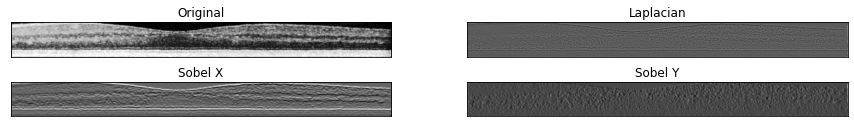

In [5]:
indices = np.arange(0,768)
img = X[indices]
img_laplacian = X_laplacian[indices]
img_sobelx = X_sobelx[indices]
img_sobely = X_sobely[indices]
plt.figure(figsize=(15,2))
plt.subplot(2,2,1),plt.imshow(img.T,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(img_laplacian.T,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(img_sobelx.T,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(img_sobely.T,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.savefig('figures/GRAD_OCTs')
plt.show()

In [4]:
X_train, y_train = X_sobelx[:768*15*14,:], y[:768*15*14]
X_valid, y_valid = X_sobelx[768*15*14:,:], y[768*15*14:]

print("training set:", X_train.shape[0])
print("validation set:", X_valid.shape[0])

training set: 161280
validation set: 32256


## 5.2 One model study.

### Train only one type of model.

## 5.2.1 : TSNE 
Does not need train and test.

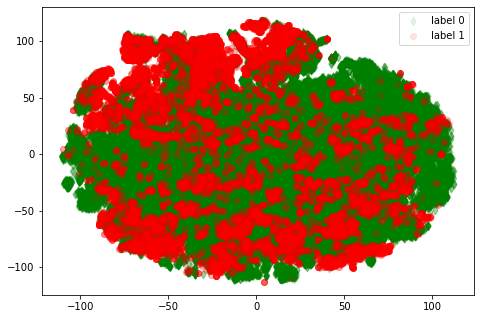

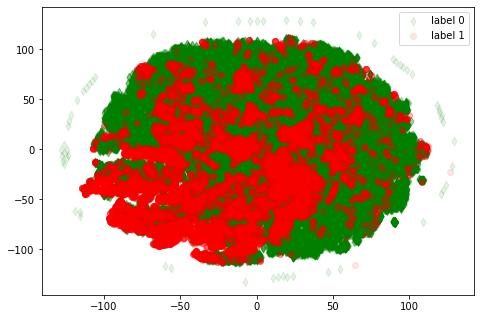

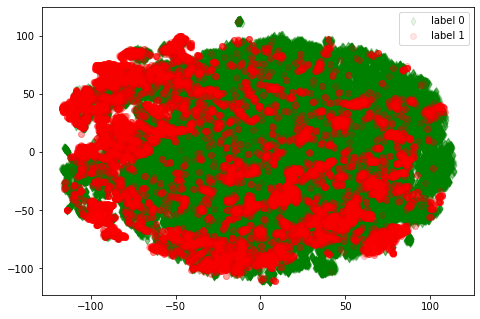

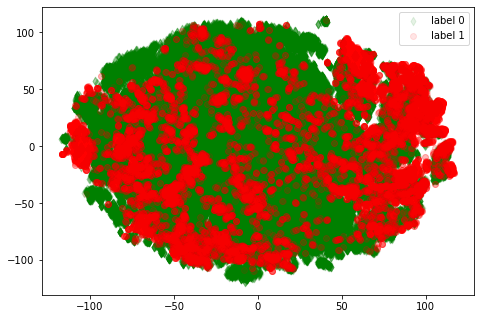

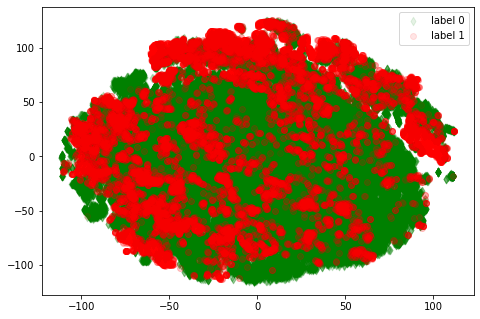

In [6]:
model = TSNE
params = {
    'n_components': 2,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y).astype(bool)
mask1 = np.array(y).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    fig.savefig('figures/GRAD_TSNE_'+savefile_normmode[j])
    

## 5.2.2 UMAP

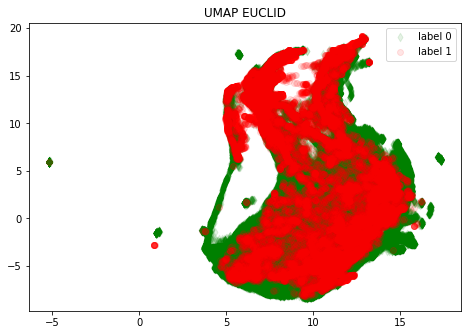

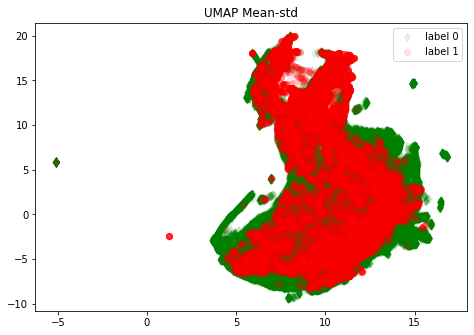

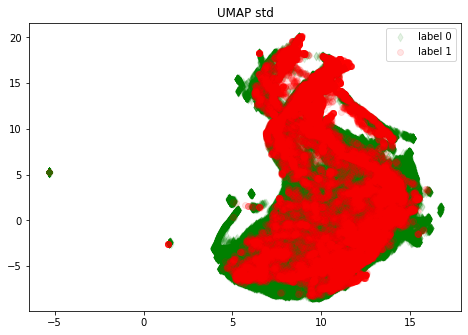

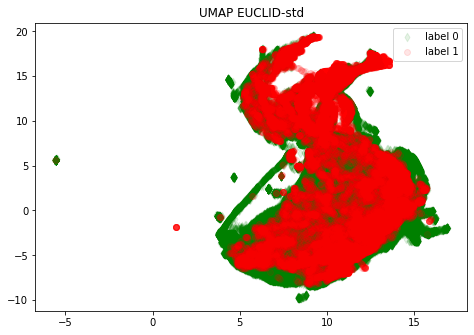

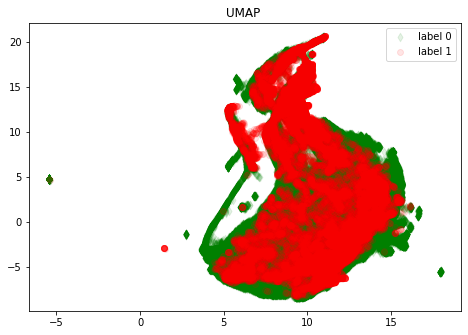

In [7]:
model = umap.UMAP
params = {
    'n_components': 2,
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y).astype(bool)
mask1 = np.array(y).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('UMAP '+ normmode)
    fig.savefig('figures/GRAD_UMAP_'+savefile_normmode[j], bbox_inches='tight')

## 5.3 compare supervised dim. reduction models


In [5]:
Models = [PCA, KernelPCA]
dimred_params=[None,  None]
dimred_normmode=['Mean-std', 'EUCLID', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
kf = KFold(n_splits=6, shuffle=False)
savefile=['PCA','KernelPCA']

START TRAINING: GRAD_PCA_Mean-std_fold_0
training set: 161280
Norm mode: Mean-std
M0.shape: (133475, 70)
M1.shape: (27805, 70)
M0.shape + M1.shape: 161280
LABEL 0:
components:
 [[-3.24934007e-18 -9.11404104e-02 -1.00474846e-01 ...  2.24834886e-02
   1.32517335e-02  7.65041330e-17]
 [ 2.60366898e-18 -2.25429333e-01 -2.96338315e-01 ...  1.13063203e-02
   1.86324682e-02  1.99061194e-16]
 [ 7.74392221e-19  2.39827417e-01  2.51940605e-01 ...  1.71900612e-02
   1.60537829e-02 -1.47775089e-16]
 ...
 [ 1.13485692e-20 -2.75851587e-03  5.21643751e-03 ... -2.73050501e-02
   8.54525942e-03  4.64905892e-16]
 [ 7.07106780e-01  1.11022302e-16 -2.77555756e-17 ...  2.51534904e-17
  -4.14165230e-17  7.07106782e-01]
 [ 7.07106782e-01 -1.11022302e-16  3.46944695e-17 ... -2.30935063e-17
   3.25260652e-17 -7.07106780e-01]]
singular values: [9.89706930e+02 8.92295771e+02 8.41502517e+02 7.98784265e+02
 6.58064754e+02 6.11819592e+02 5.68332456e+02 5.34243383e+02
 4.82997422e+02 4.61572341e+02 4.49242103e+02 4.

c:\Users\line\Desktop\Mauro\5_Thickness\OCT_thickness\helpers.py:262: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, sharex=True, sharey=True)


START TRAINING: GRAD_PCA_EUCLID_fold_1
training set: 161280
Norm mode: EUCLID
M0.shape: (130360, 70)
M1.shape: (30920, 70)
M0.shape + M1.shape: 161280
LABEL 0:
components:
 [[-6.60014203e-20 -1.08212536e-01 -1.06475737e-01 ...  2.37990690e-02
   3.38844104e-02 -0.00000000e+00]
 [-9.43560394e-20 -2.59618026e-01 -3.06037319e-01 ... -6.92060675e-04
  -2.68011723e-04  0.00000000e+00]
 [-2.46345627e-19  2.23943558e-01  2.06072713e-01 ...  9.88645153e-03
   7.92851037e-03 -0.00000000e+00]
 ...
 [ 5.19769627e-17 -2.19671309e-03  4.59554465e-03 ... -2.69012635e-02
   8.28652951e-03  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  1.00000000e+00]
 [ 1.00000000e+00 -7.04869404e-19  3.50665178e-19 ...  4.95685685e-18
  -9.27955620e-19 -0.00000000e+00]]
singular values: [1.13962664e+02 1.02637138e+02 9.65758037e+01 9.42277063e+01
 7.76325023e+01 7.10382664e+01 6.79553682e+01 6.35039492e+01
 5.64715447e+01 5.47899021e+01 5.06390733e+01 4.9247

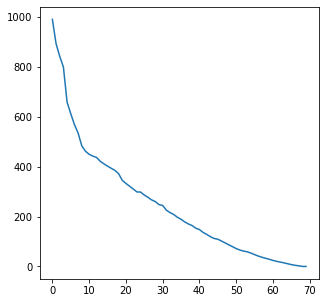

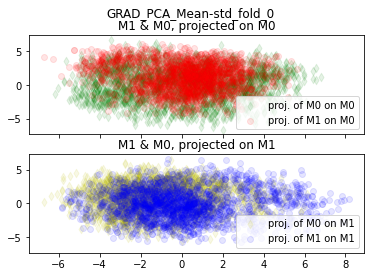

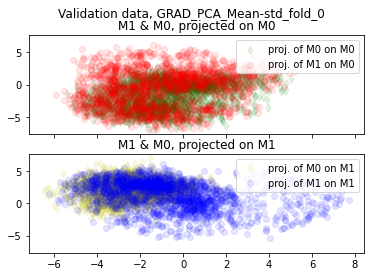

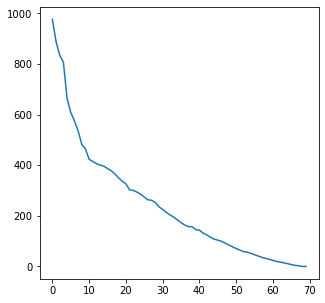

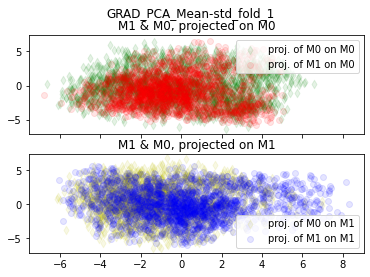

...

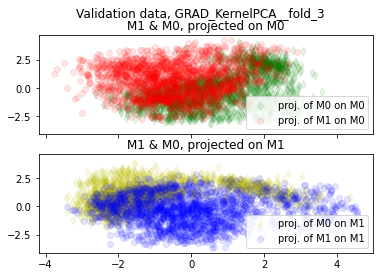

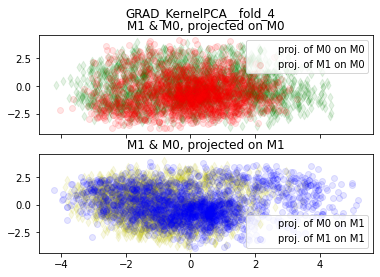

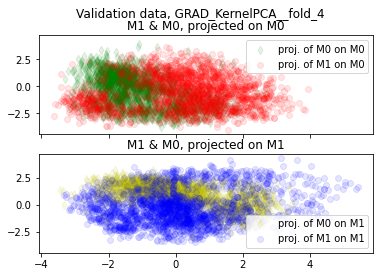

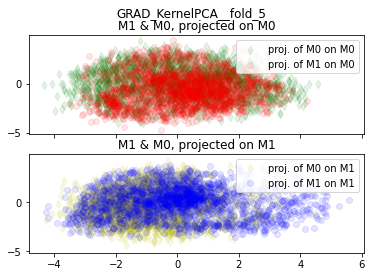

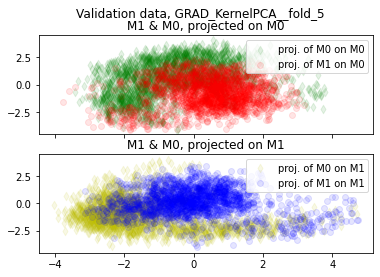

In [6]:
for i, model in enumerate(Models):
    for j, normmode in enumerate(dimred_normmode):
        plot_cv(model, X_sobelx, y, dimred_params=dimred_params[i], dimred_normmode=dimred_normmode[j], cv=kf, savefile='GRAD_'+savefile[i]+"_"+savefile_normmode[j])